In [5]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import scipy.linalg as spy
import h5py

import tomopy
#from hotopy.phase import CTF, Tikhonov, Constraints

#import sscFresnel
import tomopy
#from hotopy.phase import CTF, Tikhonov, Constraints
#import sscResolution

from scipy.ndimage import gaussian_filter1d, gaussian_filter
from scipy.signal import fftconvolve

c = 299792458               
plank = 4.135667662E-15    
CONST = plank * c
DEVICE = 'cpu'
GPUS = [0]
CPUS = 32

In [6]:
def print_fig(x, names = None):
    n = len(x)
    
    fig, ax_ = plt.subplots(1,n, figsize = (10*n,8*n))
    if(n == 1):
        ax_ = [ax_]
        
    for i,ax in enumerate(ax_): # mostra as imagens
        if i == 1:
            im = ax.imshow(x[i],cmap='viridis_r',vmax=1)
        else:
            im = ax.imshow(x[i],cmap='viridis_r')
        divider = make_axes_locatable(ax) # colorbar
        cax = divider.append_axes('right', size='5%', pad=0.05)
        fig.colorbar(im, cax=cax, orientation='vertical')
        ax.set_xlim(0,x[i].shape[1])
        ax.set_ylim(x[i].shape[0],0)
        
        if names != None:
            ax.set_title(names[i])
    
    plt.show()

In [7]:
path = '/home/bruno.focassio/tomo/tutorial_sirius_file/'
sample = 'tomo_A20A_eps_1263nm_000.hdf5'

In [12]:
with h5py.File(path+sample, 'r') as f:
    proj        = f['scan/detector/data'][0,:,:].astype(np.float32())
    slices, x   = proj.shape

    flat    = f['scan/detector/flats'][0,0,:,:].astype(np.float32()) # sinais do detector sem amostra (para testar eu acho)
    dark    = f['scan/detector/darks'][0,0,:,:].astype(np.float32()) # sinais com detector fechado (para corrigir ruído do detector)

    z1      = f['snapshot/after/beamline-state/position/nano-station/z1/value'][()] * 1e-3
    z2      = f['snapshot/after/beamline-state/position/nano-station/z2/value'][()] * 1e-3
    z1z2    = f['snapshot/after/beamline-state/position/nano-station/z1+z2/value'][()] * 1e-3
    pixel   = f['snapshot/after/beamline-state/position/detector/pixel-size-x/value'][()] * 1e-3

    magn      = (z1+z2) / z1 # fator de magnitude da projeção (ampliação)
    pixel_obj = pixel / magn # tamanho do pixel na amostra (resolução real)
    z2_eff    = z2 / magn # foco 

print(pixel_obj)

1.3386313810053653e-06


In [11]:
print(z1, z2, pixel)

0.9298775 0.07041549999999999 1.44e-09


In [10]:
import h5py
import numpy as np

path = "/home/bruno.focassio/tomo/tutorial_sirius_file/"
sample = "tomo_A20A_eps_1263nm_000.hdf5"

with h5py.File(path + sample, 'r') as f:
    # --- Dados do detector ---
    proj = f['scan/detector/data'][0, :, :].astype(np.float32)
    slices, x = proj.shape
    
    # --- Flats e darks (para correção de ruído e background) ---
    flat = f['scan/detector/flats'][0,0,:,:].astype(np.float32)
    dark = f['scan/detector/darks'][0,0,:,:].astype(np.float32)

    # --- Distâncias geométricas ---
    z1 = f['snapshot/after/beamline-state/position/nano-station/z1/value'][()] * 1e-3  # m
    z2 = f['snapshot/after/beamline-state/position/nano-station/z2/value'][()] * 1e-3  # m
    z1z2 = f['snapshot/after/beamline-state/position/nano-station/z1+z2/value'][()] * 1e-3  # m

    # --- Pixel size do detector ---
    pixel = f['snapshot/after/beamline-state/position/detector/pixel-size-x/value'][()] * 1e-6  # m (às vezes vem em µm, checar unidade!)

    # --- Cálculo da magnificação ---
    magn = (z1 + z2) / z1

    # --- Tamanho real do pixel no objeto (resolução espacial) ---
    pixel_obj = pixel / magn  # [m/px]

    # --- Voxel size (assumindo isotropia) ---
    voxel_size = pixel_obj  # [m³ por voxel] → se quiser o volume, eleva ao cubo

print(f"z1 = {z1:.4e} m, z2 = {z2:.4e} m, magn = {magn:.3f}")
print(f"Tamanho do pixel na amostra (voxel_size) = {voxel_size*1e6:.3f} µm")

z1 = 9.2988e-01 m, z2 = 7.0415e-02 m, magn = 1.076
Tamanho do pixel na amostra (voxel_size) = 0.001 µm


In [5]:
def open_file(path,sample,slice):

        with h5py.File(path+sample, 'r') as f:
                proj        = f['scan/detector/data'][slice,:,:].astype(np.float32())
                slices, x   = proj.shape

                flat   = f['scan/detector/flats'][0,0,:,:].astype(np.float32())
                dark    = f['scan/detector/darks'][0,0,:,:].astype(np.float32())

                z1      = f['snapshot/after/beamline-state/position/nano-station/z1/value'][()] * 1e-3
                z2      = f['snapshot/after/beamline-state/position/nano-station/z2/value'][()] * 1e-3
                z1z2    = f['snapshot/after/beamline-state/position/nano-station/z1+z2/value'][()] * 1e-3
                pixel   = f['snapshot/after/beamline-state/position/detector/pixel-size-x/value'][()] * 1e-3

                magn      = (z1+z2) / z1
                pixel_obj = pixel / magn
                z2_eff    = z2 / magn

        return proj,flat,dark,magn,pixel_obj,z2_eff

In [6]:
proj.shape,flat.shape,dark.shape,slices,x

((2048, 2048), (2048, 2048), (2048, 2048), 2048, 2048)

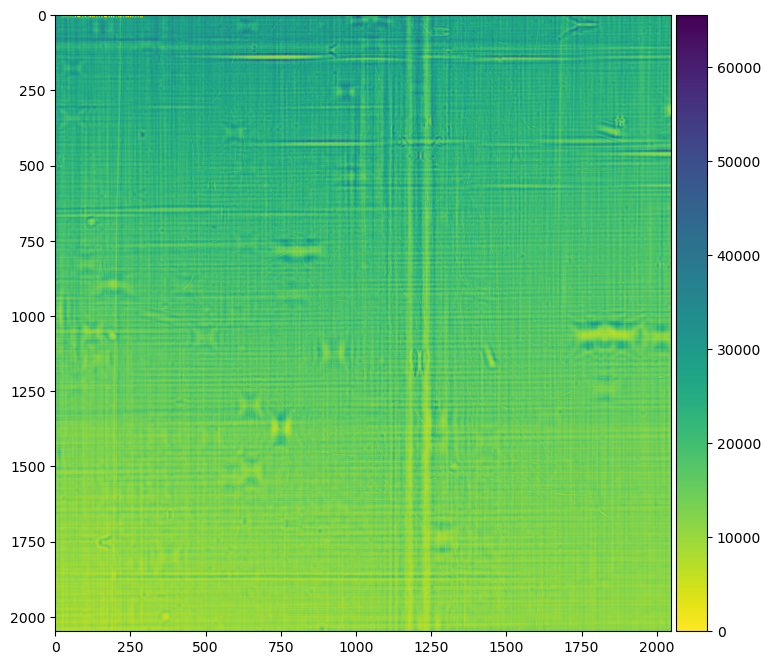

In [7]:
print_fig([proj])

In [8]:
# Flat/Dark Correction
norm = (proj - dark)/(flat-dark)
norm[np.isinf(norm)] = 1.0
norm[np.isnan(norm)] = 1.0

#print_fig([proj, norm])

/tmp/ipykernel_1814111/662845105.py:2: RuntimeWarning: divide by zero encountered in divide
  norm = (proj - dark)/(flat-dark)
/tmp/ipykernel_1814111/662845105.py:2: RuntimeWarning: invalid value encountered in divide
  norm = (proj - dark)/(flat-dark)


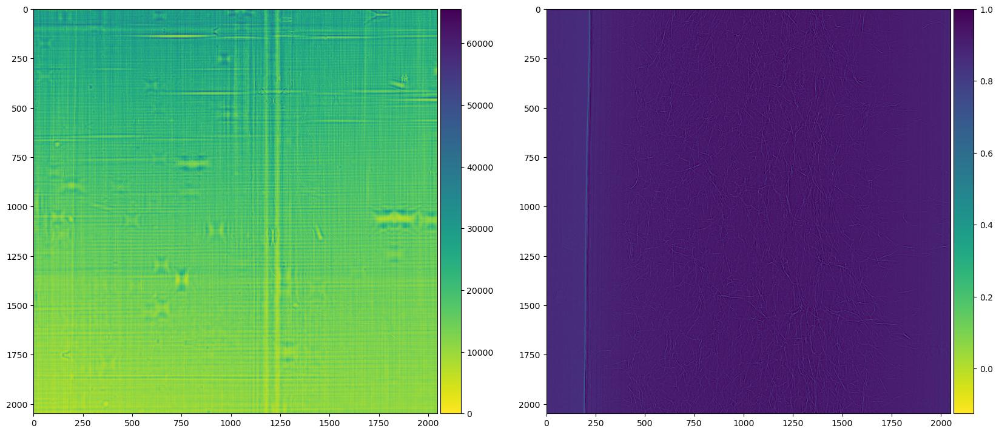

In [9]:
print_fig([proj, norm])

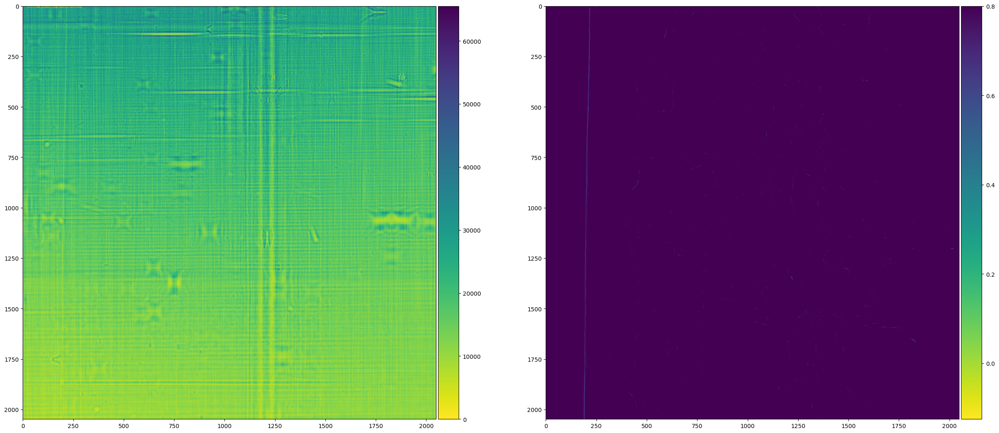

In [10]:
fig,ax = plt.subplots(1,2,figsize=(30,24))

im_proj = ax[0].imshow(proj,cmap='viridis_r')
divider_proj = make_axes_locatable(ax[0])
cax_proj = divider_proj.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im_proj, cax=cax_proj, orientation='vertical')
ax[0].set_xlim(0,proj.shape[1])
ax[0].set_ylim(proj.shape[0],0)

im_norm = ax[1].imshow(norm,cmap='viridis_r',vmax=0.8)
divider_norm = make_axes_locatable(ax[1])
cax_norm = divider_norm.append_axes('right', size='5%', pad=0.05)
fig.colorbar(im_norm, cax=cax_norm, orientation='vertical')
ax[1].set_xlim(0,norm.shape[1])
ax[1].set_ylim(norm.shape[0],0)
            
plt.show()

In [11]:
for i in range(0,1017,50):
    proj,flat,dark,_magn,_pixel_obj,_z2_eff = open_file(path,sample,slice=i)

    norm = (proj - dark)/(flat-dark)
    norm[np.isinf(norm)] = 1.0
    norm[np.isnan(norm)] = 1.0

    #print(i)
    
    #print_fig([proj,norm])

/tmp/ipykernel_1814111/1575548943.py:4: RuntimeWarning: divide by zero encountered in divide
  norm = (proj - dark)/(flat-dark)
/tmp/ipykernel_1814111/1575548943.py:4: RuntimeWarning: invalid value encountered in divide
  norm = (proj - dark)/(flat-dark)


## Apenas testes e tentando entender qual filtro se encaixa melhor

0.9298775 0.07041549999999999 0.48574861648274187


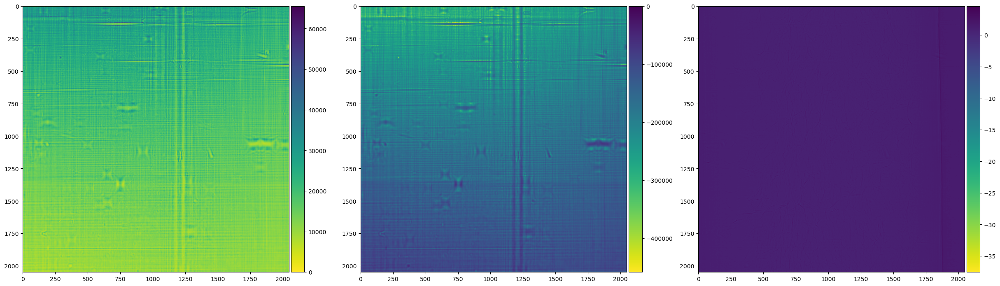

In [12]:
alpha = [1e-4, 5e-2] 
betadelta = 0.05

energy = 22e3
wave = CONST/energy

Fresnel = z1*pixel*pixel/(wave*z2*(z2+z1))
print(z1, z2, Fresnel)

ctf = CTF(proj.shape, Fresnel, betadelta=betadelta, alpha=alpha, device=DEVICE)
result_ctf = ctf(proj)

if DEVICE == 'cuda':
    Ctf = - result_ctf.cpu() # devido ao pytorch
    Ctf = Ctf.numpy()
else:
    Ctf = - result_ctf.numpy()

ctf_norm = CTF(norm.shape, Fresnel, betadelta=betadelta, alpha=alpha, device=DEVICE)
result_ctf_norm = ctf_norm(norm)

if DEVICE == 'cuda':
    Ctf_norm = - result_ctf_norm.cpu() # devido ao pytorch
    Ctf_norm = Ctf_norm.numpy()
else:
    Ctf_norm = - result_ctf_norm.numpy()

print_fig([proj, Ctf, Ctf_norm])

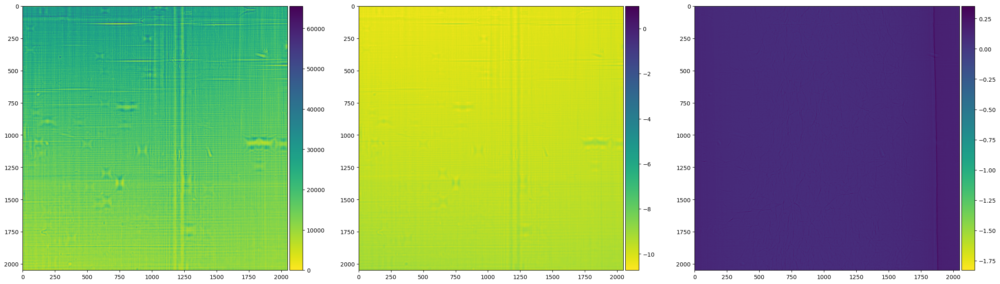

In [13]:
betadelta = 1e-3

tomopy_tomo = tomopy.prep.phase.retrieve_phase(
            np.expand_dims(proj,0),
            pixel_size=pixel_obj*100,
            dist= z2_eff*100,
            energy=energy/1e3,
            alpha=betadelta,
            ncore=CPUS,
            pad=True,
        )

Pag = -np.log(tomopy_tomo[0])

tomopy_tomo_norm = tomopy.prep.phase.retrieve_phase(
            np.expand_dims(norm,0),
            pixel_size=pixel_obj*100,
            dist= z2_eff*100,
            energy=energy/1e3,
            alpha=betadelta,
            ncore=CPUS,
            pad=True,
        )

Pag_norm = -np.log(tomopy_tomo_norm[0])

print_fig([proj, Pag, Pag_norm])

In [14]:
def read_and_normalize_tomogram(path, sample, slices = [0,2048], eixo_rot = None):

    with h5py.File(path+sample, 'r') as f:
        flat      = np.mean(np.mean(f['scan/detector/flats'][:, :, slices[0]:slices[1], :].astype(np.float32()),axis=0),axis=0)
        dark      = np.mean(np.mean(f['scan/detector/darks'][:, :, slices[0]:slices[1], :].astype(np.float32()),axis=0),axis=0)
        tomogram  = f['scan/detector/data'][:,slices[0]:slices[1],:].astype(np.float32())

    tomogram = -np.log((tomogram - dark[np.newaxis,:,:])/(flat[np.newaxis, :, :] - dark[np.newaxis, :, :]))
    tomogram[np.isnan(tomogram)] = 0.0
    tomogram[np.isinf(tomogram)] = 0.0


    if(eixo_rot == None):
        # 180
        deviation = sscRaft.Centersino(tomogram[0], tomogram[tomogram.shape[0]-1], 
                    np.ones((tomogram.shape[1], tomogram.shape[2])), np.zeros((tomogram.shape[1], tomogram.shape[2])))
        #360
        # deviation = sscRaft.Centersino(tomogram[0], tomogram[tomogram.shape[0]//2], 
        #             np.ones((tomogram.shape[1], tomogram.shape[2])), np.zeros((tomogram.shape[1], tomogram.shape[2])))
        print(deviation)
    else:
        deviation = eixo_rot
        print(deviation)
        

    if(deviation < 0):
        tomogram = pad_volume(tomogram, 0, -2*deviation)
    if(deviation > 0):
        tomogram = pad_volume(tomogram, 2*deviation, 0)

    tomogram = np.swapaxes(tomogram,0,1)

    return tomogram

def pad_volume(volume, k_left, k_right):
    """
    Pads a 3D volume along the third axis with the border values.

    Parameters:
        volume (numpy.ndarray): 3D array of shape (x, y, N).
        k (int): Padding size.

    Returns:
        numpy.ndarray: Padded 3D volume of shape (x, y, N + 2k).
    """
    if (k_left < 0) or (k_right < 0):
        raise ValueError("Padding size k must be non-negative")
    if volume.ndim != 3:
        raise ValueError("Input volume must be a 3D array")
    
    # Extract border values along the third axis
    left_pad = np.tile(volume[:, :, 0:1], (1, 1, k_left))  # Left padding
    right_pad = np.tile(volume[:, :, -1:], (1, 1, k_right))  # Right padding
    
    # Concatenate paddings with the original volume
    padded_volume = np.concatenate([left_pad, volume, right_pad], axis=2)
    
    return padded_volume

def save_hdf5(filepath, recon):
    # Ensure recon is in float32 format without creating an unnecessary copy
    if recon.dtype != np.float32:
        recon = recon.astype(np.float32, copy=False)  # Use copy=False to avoid duplication
    
    # Use a context manager to handle the file
    with h5py.File(filepath, 'w') as file:
        # Use chunking and compression for large datasets
        file.create_dataset("data", data=recon)

13
(10, 1017, 2074)


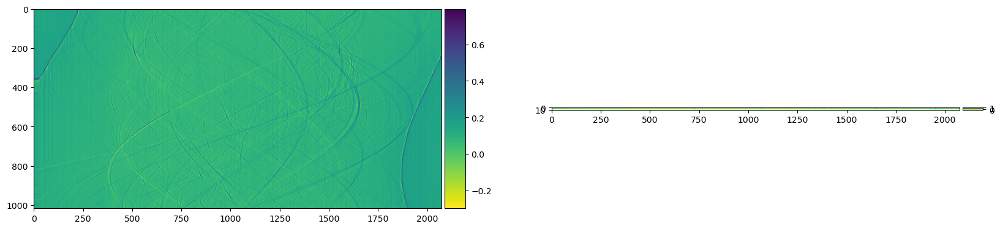

In [20]:
'''Teste eixo de rotação'''

tomogram = read_and_normalize_tomogram(path, sample, [1000,1010], eixo_rot = 13)
slices, angles, length = tomogram.shape
print(tomogram.shape)
#180
theta = np.linspace(0,np.pi,angles)
#360
# theta = np.linspace(0,2*np.pi,angles)

print_fig([tomogram[slices//2], tomogram[:,angles//2,:]])

In [25]:
print(type(x))

<class 'int'>


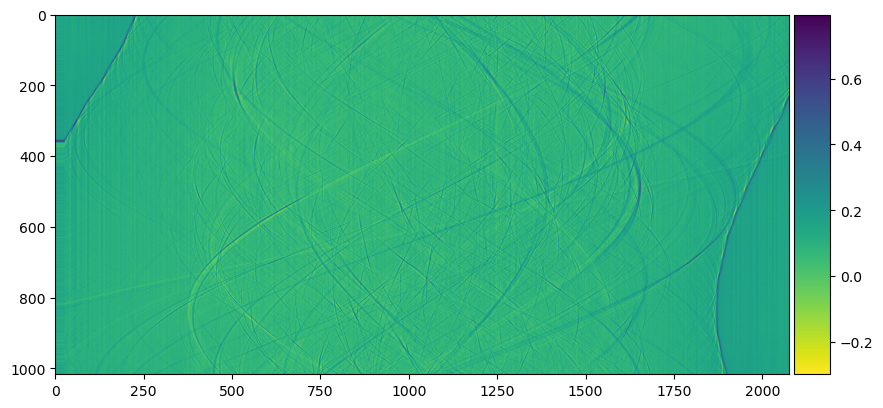

In [29]:
"""sinograma"""

mid_slice = tomogram.shape[0]//2
sinogram = tomogram[mid_slice, :, :]

print_fig([sinogram])

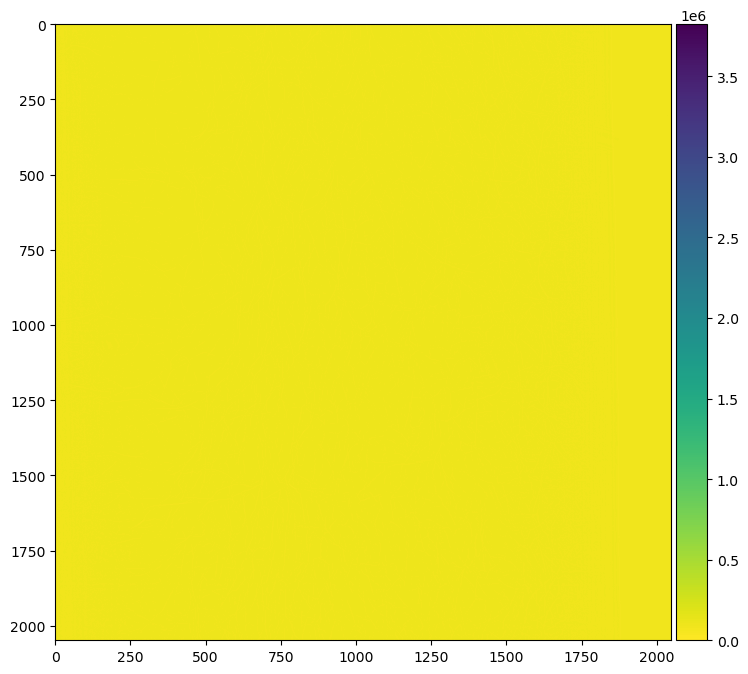

In [38]:
photon_count = 1e5
norm = np.clip(norm, 0, None)
norm_ = norm * photon_count
prj_poisson = tomopy.add_poisson(norm_ / 100) * 100

print_fig([prj_poisson])

conclusão: não consegui adicionar ruido poisson, aparentemente só da pra adicionar com todos os valores da projeção sendo positivos, e quando tentei normalizar (de novo) acabei deixando todos os valores iguais.

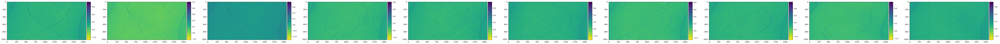

In [45]:
def add_rings(tomo, std=0.05):
    new_tomo = np.copy(tomo)
    sensitivity = np.random.normal(
        loc=1, scale=std,
        size=(1, new_tomo.shape[1], new_tomo.shape[2])
    )
    new_tomo = new_tomo * sensitivity
    return new_tomo

prj_rings = add_rings(tomogram)

print_fig([prj_rings][0])

deu certo, aparentemente. não entendi porque estão aparecendo tantas imagens

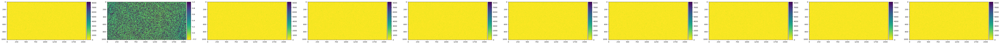

In [48]:
def add_zingers(tomo, f=0.01, sat=2**16):
    zingers = np.random.uniform(0, 1, tomo.shape)
    zingers = zingers <= f  # five percent of measurements are zingers
    new_tomo = np.copy(tomo)
    new_tomo[zingers] = sat
    return new_tomo

prj_zingers = add_zingers(tomogram, f=0.01, sat=2**13)

print_fig([prj_zingers][0])

não era pra ter ficado assim. só a segunda projeção se parece com o que deveria.

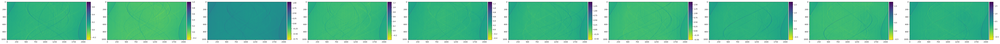

In [49]:
def add_drift(tomo, amp=0.2, period=50, mean=1):
    new_tomo = np.copy(tomo)
    x = np.arange(tomo.shape[0])
    drift = amp * np.sin(2 * np.pi / period * x) + mean
    drift = drift + np.linspace(0, 1, len(x))
    drift = drift[:, np.newaxis, np.newaxis]
#     return drift + tomo * 0
    return drift * tomo

prj_drift = add_drift(tomogram, amp=0.5)

print_fig([prj_drift][0])

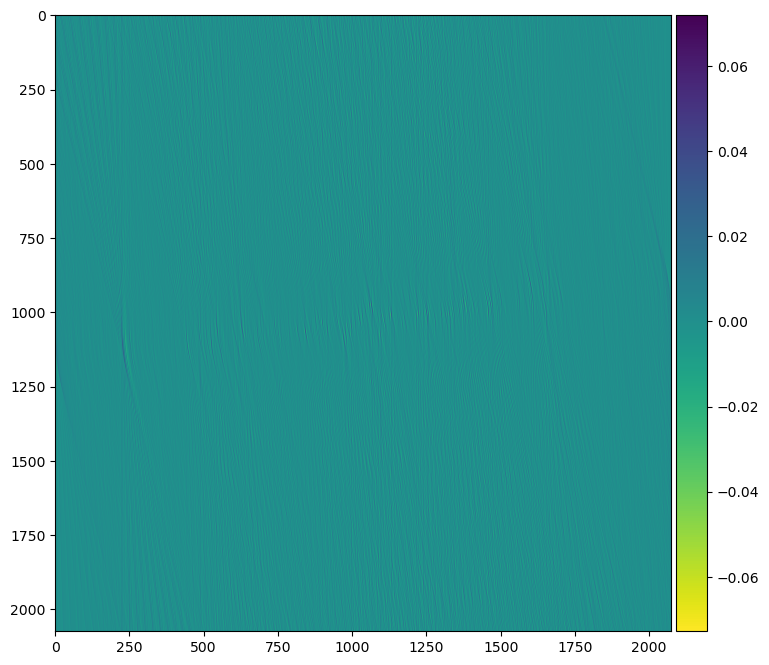

In [41]:
rec = dict()

rec['gridrec'] = tomopy.recon(tomo=tomogram, theta=ang, algorithm='gridrec')
print_fig([rec['gridrec'][0]])

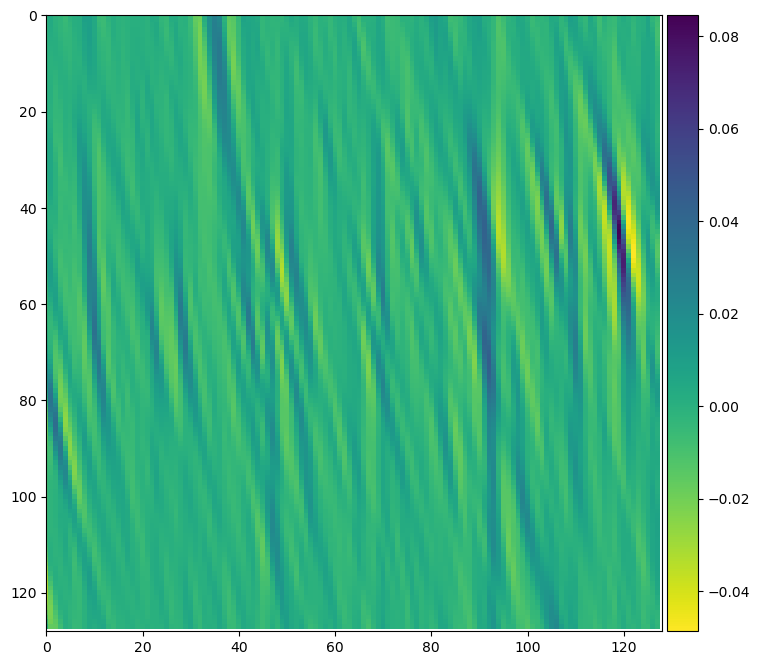

In [53]:
rec['gridrec'] = tomopy.recon(
    tomogram, ang, algorithm='gridrec', 
    num_gridx=128, num_gridy=128, 
    filter_name='butterworth', filter_par=[0.3, 2.],
)

nz = rec['gridrec'].shape[0]
mid = nz // 2

print_fig([rec['gridrec'][mid]])

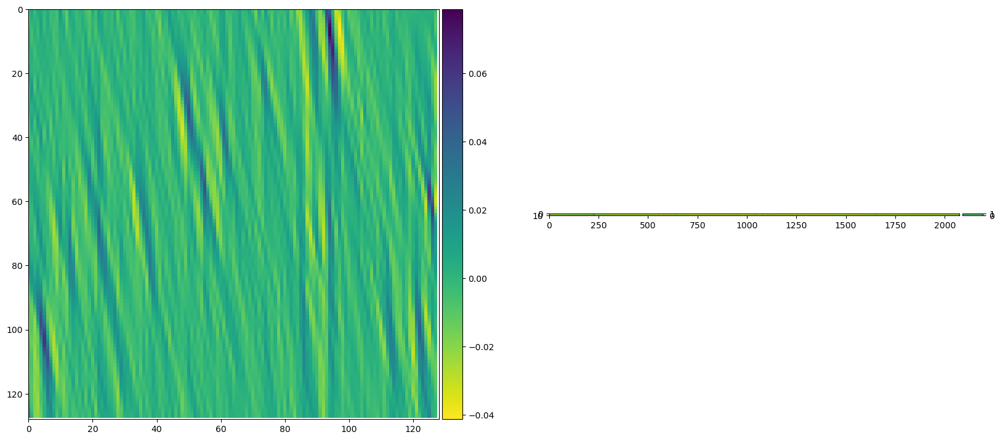

In [59]:
rec['before'] = tomopy.recon(tomo=tomogram, theta=ang, algorithm='gridrec', num_gridx=128, num_gridy=128)

z = 1  # slice that has the poisson noise
prj_corrected = tomopy.median_filter(tomogram, axis=0)

print_fig([rec['before'][1], prj_corrected[:, z, :]])

In [ ]:
def set_dictionary_phase(Type,alpha,gamma,maxitN,maxitCG,z1,z2,pixel,energy):
    # ======= SET DICTIONARY ========================
    dic = {}
    dic['gpu'] = [0]
    dic['blocksize'] = 1
    dic['regularization'] = (Type,alpha,gamma,0.0) 
    dic['maxiterations']  = (max_iter_newton, max_iter_cg) 
    
    dic['z1']             = (z1,z1) 
    dic['z2']             = (z2,z2) 
    dic['energy']         = energy
    dic['detpixelsize']   = (pixel,pixel)
    dic['beamgeometry']   = 'conebeam'
    
    # Parametros de DEV: Com BUGS ============================================
    dic['regularizationextra'] = (2/3,False) 
    dic['tolerances']          = (1e-8, 1e-8) # não use
    dic['ratio']               = 0 # não use
    dic['poni']                = (0, 0)               # não use
    dic['mask']                = (False, None)        # não use
    dic['normX']               = False                # não use
    dic['support']             = (False, None)        # não use
    dic['zeropadding']         = (0, 0, False, False) # não mudar valores aqui: bugs
    dic['rotationdetector']    = (0, 0, False)        # não use
    dic['samplemasscenter']    = (0, 0)               # não use

    return dic

energy = 22e3
wave = CONST/energy

Fresnel = z1*pixel*pixel/(wave*z2*(z2+z1))
print(z1, z2, Fresnel)

In [ ]:
Type = 'Tik' # Tikhonov regularization
alpha = -1   # -1 automatic computation; alpha > 0
gamma = -1   # -1 automatic computation; gamma > 0

max_iter_newton = 10 # iterative Newton method
max_iter_cg     = 20 # Conjugate Gradients method

dic = set_dictionary_phase(Type, alpha, gamma, max_iter_newton, max_iter_cg, z1, z2, pixel, energy)

initial_guess = 0*proj + 1j*0*proj # COMPLEX Initial Guess for method

Prain = sscFresnel.phase_retrieval(proj, initial_guess, dic)
Prain_abs = Prain.real[0]
Prain_phase = Prain.imag[0]

In [ ]:
Type = 'Lap' # Option: 'Tik' (Tikhonov regularization) or 'Lap' (Laplacian regularization)
alpha = -1   # -1 automatic computation; alpha > 0
gamma = -1   # -1 automatic computation; gamma > 0

max_iter_newton = 10 # iterative Newton method
max_iter_cg     = 20 # Conjugate Gradients method

dic = set_dictionary_phase(Type, alpha, gamma, max_iter_newton, max_iter_cg, z1, z2, pixel, energy)

initial_guess = 0*proj + 1j*0*proj # COMPLEX Initial Guess for method

Prain = sscFresnel.phase_retrieval(proj, initial_guess, dic)
Prain_abs = Prain.real[0]
Prain_phase = Prain.imag[0]

#print_fig([Prain_abs, Prain_phase])

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
from mpl_toolkits.axes_grid1 import make_axes_locatable
import sscRaft
from scipy.ndimage import median_filter
from time import time
import sscRaftApps

from scipy.ndimage import uniform_filter1d
from scipy import interpolate
import sscRings

tomogram = sscRings.rings_remove_all_stripes(tomogram, 1, 
                                           settings = {'size_median':17, 'large_stripes_size':61, 'background_ratio':10, 'drop_ratio':0.1, 'dim':1})



recon_corrected = sscRaft.fdk(tomogram,{'gpu': [0],'angles[rad]':theta, 'z1[m]':z1, 'z1+z2[m]':z1z2,
                                                     'detectorPixel[m]':pixel, 'beta/delta': 0.0,
                                                      'energy[eV]':22e3,'padding':2,'filter':'hamming'})

print_fig([proj, recon_corrected[slices//2]])

**objetivos:** 
transformar os dados em sinograma, definir imagens (encontrar projeções com efeitos especificos) para serem benchmarks (referencias), testar os metodos de tratamento do tutorial do tomopy para remover aneis, remover linhas, mexer nos valores v_min e v_max para melhorar a visualização das projeções. fazer phase retrieval do tomopy.